In [3]:
%matplotlib inline
%config InlineBackend.figure_formats = ['svg']

import matplotlib
matplotlib.rcParams['font.sans-serif'] = "Arial"
# matplotlib.rcParams['figure.dpi'] = 80
matplotlib.rcParams['figure.figsize'] = [14, 6]
matplotlib.rcParams['axes.grid'] = True

In [4]:
%load_ext autoreload
%autoreload 2

import sys
sys.version_info

import sys
sys.path.insert(0, '../')


import numpy as np
import matplotlib.pyplot as plt

from lib_data import *

# import tensorflow as tf
# import tensorflow.compat.v1 as tf1
# tf1.disable_eager_execution()

# import nb_func2 as f
import random

# f.DIR = 'models.save3/'
# f.FILE_MODEL = 'model.ckpt-270090'
from tqdm.notebook import tqdm
from lib_lsh import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [75]:
load_workspace(vars(), filename='25shot_may18')

Loaded: mem_vals, mem_keys, x, y, x_new, y_new, qs, qs_new, 


In [91]:
y_new = y_new[:20]

In [92]:
hash_planes = np.random.randn(128, 64) 

In [93]:
hash_key = [get_lsh(k, hash_planes) for k in mem_keys]

In [94]:
y_true = []
y_preds= []

for i, (qq, yy) in enumerate(zip(qs_new, y_new)): 
#     if i< episode_width * n_shot:
#         continue
        
#     v_query = f.sess.run(query, feed_dict={x_ph: xx, y_ph:yy})
#     normalized_query = qq / np.linalg.norm(qq, axis=1)

    q_hash = get_lsh(qq, hash_planes).reshape(-1)
    
    distance  = hamming(q_hash, hash_key)
    y_pred = mem_vals[distance.argmin()]
    
#     similarities = normalized_query @ mem_keys.T
#     y_pred = mem_vals[similarities.argmax()]
    
    y_preds.append(y_pred)
    y_true.append(yy[0])
    
y_true = np.array(y_true)
y_preds= np.array(y_preds)

print(np.mean(y_true==y_preds))

0.85


In [95]:
len(y_new)

20

In [124]:
from dpe import DPE

dpe = DPE('COM9')
dpe.set_clock(50)

DAC initialized to a span from -10 V to 10 V
Setting vrefs to default
Setting ADC_CK freq=50000.0kHz
Setting CK_ARRAY freq=50000.0kHz


....

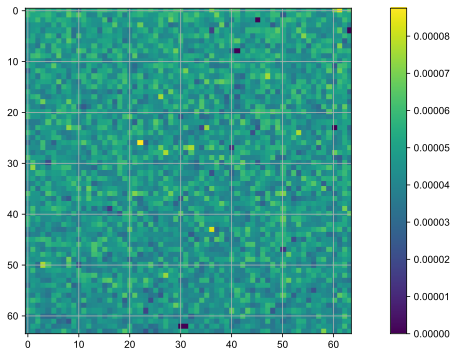

In [97]:
g = dpe.read(0, method='slow')
plt.imshow(g)
plt.colorbar()

In [14]:
# vec = np.random.rand(64, 1) - 0.5

# vec = np.reshape(vec, -1)
# vec = vec / np.linalg.norm(vec)

# vec_pos = vec.copy()
# vec_pos[vec_pos<0] = 0


# vec_neg = vec.copy()
# vec_neg[vec_neg>0] = 0

# scaling = max( vec_pos.max(), -vec_neg.min())

# vec_neg = -vec_neg/scaling
# vec_pos =  vec_pos/scaling


# Ipos = vec_pos @ g
# Ineg = vec_neg @ g

# Ires = Ipos - Ineg

# print(Ires)

# (Ires[::2] > Ires[1::2]).astype(int)

In [82]:
# vec

In [83]:
# g = np.random.randn(64,64) * 10e-6 + 100e-6
# plt.imshow(g); plt.colorbar()

In [15]:
# g = dpe.read(0, method='slow')

....

In [16]:
# def get_lsh_dpe(vec, software=False):
#     '''Get lsh code from a normalized vector'''
    
#     # Make sure the vector is normalized
#     vec = np.reshape(vec, -1)
# #     vec = vec / np.linalg.norm(vec)

#     vec_pos = vec.copy()
#     vec_pos[vec_pos<0] = 0


#     vec_neg = vec.copy()
#     vec_neg[vec_neg>0] = 0

#     scaling = max( vec_pos.max(), -vec_neg.min())

#     vec_neg = -vec_neg/scaling
#     vec_pos =  vec_pos/scaling
    
#     # Software
#     if software:
#         Ipos = vec_pos @ g
#         Ineg = vec_neg @ g
#     else:
#         Ipos = dpe.multiply(
#                 0, 
#                 np.expand_dims(vec_pos, 1), 
#                 c_sel=[0, 64], 
#                 r_start=0, mode=0, Tdly=500).T

#         Ineg = dpe.multiply(
#                 0, 
#                 np.expand_dims(vec_neg, 1), 
#                 c_sel=[0, 64], 
#                 r_start=0, mode=0, Tdly=500).T
    
#     Ires = (Ipos - Ineg).reshape(-1)
    
#     h = (Ires[::2] > Ires[1::2]).astype(int)
    
#     return h

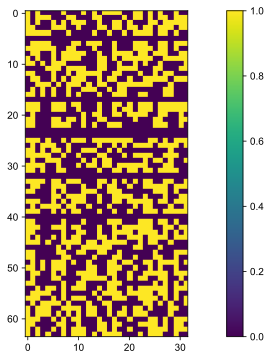

In [102]:
hash_key = [get_lsh_g(k, g) for k in tqdm(mem_keys)]

# hash_key = []

# for k in tqdm(mem_keys):
#     hash_key.append(get_lsh_dpe(k))


plt.imshow(np.array(hash_key))
plt.colorbar()
plt.grid(False)

Text(0, 0.5, 'Class')

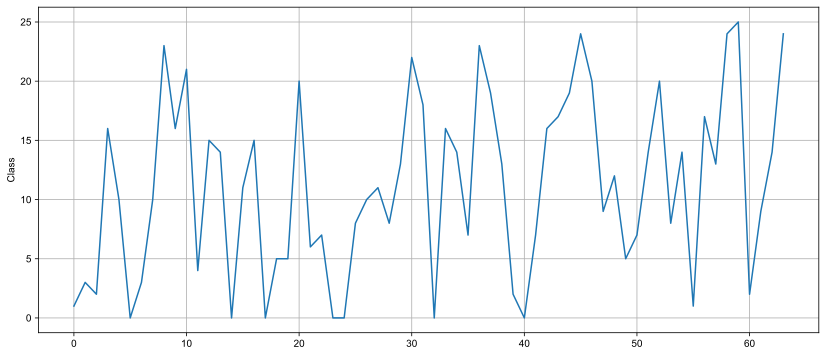

In [103]:
plt.plot(mem_vals)
plt.ylabel('Class')

In [104]:
y_true = []
y_preds= []

for i, (qq, yy) in tqdm(enumerate(zip(qs_new, y_new)), total=len(y_new)):
    if i==0:
        continue
    
    q_hash = get_lsh_g(qq, g).reshape(-1)
    
    distance  = hamming(q_hash, hash_key)
    y_pred = mem_vals[distance.argmin()]
    
#     similarities = normalized_query @ mem_keys.T
#     y_pred = mem_vals[similarities.argmax()]
    
    y_preds.append(y_pred)
    y_true.append(yy[0])
    
y_true = np.array(y_true)
y_preds= np.array(y_preds)

print(np.mean(y_true==y_preds))


0.5789473684210527


In [105]:
y_true = []
y_preds= []

for i, (qq, yy) in tqdm(enumerate(zip(qs, y)), total=len(y)): 
#     if i<125:
#         continue
    
    q_hash = get_lsh_g(qq, g).reshape(-1)
    
    distance  = hamming(q_hash, hash_key)
    y_pred = mem_vals[distance.argmin()]
    
#     similarities = normalized_query @ mem_keys.T
#     y_pred = mem_vals[similarities.argmax()]
    
    y_preds.append(y_pred)
    y_true.append(yy[0])
    
y_true = np.array(y_true)
y_preds= np.array(y_preds)

print(np.mean(y_true==y_preds))


0.856


In [92]:
save_workspace(vars(), note='lsh-hardware-g-2')

Saving In(<class 'list'>), Out(<class 'dict'>), mem_vals(<class 'numpy.ndarray'>), mem_keys(<class 'numpy.ndarray'>), x(<class 'list'>), y(<class 'list'>), x_new(<class 'list'>), y_new(<class 'list'>), qs(<class 'list'>), qs_new(<class 'list'>), hash_planes(<class 'numpy.ndarray'>), hash_key(<class 'list'>), y_true(<class 'numpy.ndarray'>), y_preds(<class 'numpy.ndarray'>), i(<class 'int'>), qq(<class 'numpy.ndarray'>), yy(<class 'numpy.ndarray'>), q_hash(<class 'numpy.ndarray'>), distance(<class 'numpy.ndarray'>), g(<class 'numpy.ndarray'>), vec(<class 'numpy.ndarray'>), vec_pos(<class 'numpy.ndarray'>), vec_neg(<class 'numpy.ndarray'>), scaling(<class 'numpy.float64'>), Ipos(<class 'numpy.ndarray'>), Ineg(<class 'numpy.ndarray'>), Ires(<class 'numpy.ndarray'>), a(<class 'int'>), to 20200617-202400-lsh-hardware-g-2.pkl
Saving In(<class 'list'>), mem_vals(<class 'numpy.ndarray'>), mem_keys(<class 'numpy.ndarray'>), x(<class 'list'>), y(<class 'list'>), x_new(<class 'list'>), y_new(<cla

## Linear correction

In [106]:
rand_vecs = np.random.rand(64, 1000)

output = dpe.multiply(
            0, 
            rand_vecs, 
            c_sel=[0, 64], 
            r_start=0, mode=0, Tdly=500)

In [107]:
g_true = np.ones((64,64)) * 50e-6
output_soft = rand_vecs.T @ g_true

In [108]:
# plt.imshow(output)

In [109]:
# plt.imshow(output_soft)

In [110]:
plt.figure(figsize=(5,4))

for c in range(output.shape[1]):
    plt.plot(output_soft[:,c], output[:,c], '.')

In [111]:
lin_cor_lsh = []
for c in range(output.shape[1]):
    lin_cor_lsh.append( np.polyfit(output[:,c], output_soft[:,c], 1))

In [112]:
output_cor = dpe.lin_corr(output, lin_cor_lsh)

In [113]:
plt.figure(figsize=(5,4))

for c in range(output.shape[1]):
    plt.plot(output_soft[:,c], output_cor[:,c], '.')

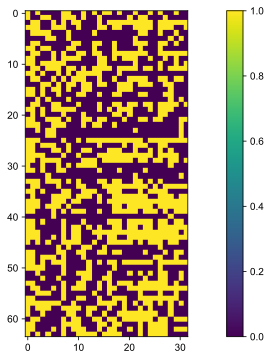

In [114]:
hash_key = [get_lsh_dpe_cor(k, dpe, lin_cor_lsh) for k in tqdm(mem_keys)]

plt.imshow(np.array(hash_key))
plt.colorbar()
plt.grid(False)

In [116]:
hash_key_dpe = hash_key.copy()

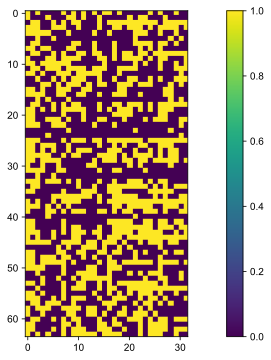

In [121]:
hash_key_raw = [get_lsh_dpe(k, dpe) for k in tqdm(mem_keys)]

plt.imshow(np.array(hash_key_raw))
plt.colorbar()
plt.grid(False)

In [69]:
len(y_new)

500

In [117]:
y_true = []
y_preds= []

for i, (qq, yy) in tqdm(enumerate(zip(qs_new, y_new)), total=len(qs_new)):
    if i==0:
        continue
    
    q_hash = get_lsh_dpe_cor(qq, dpe, lin_cor_lsh).reshape(-1)
    
    distance  = hamming(q_hash, hash_key)
    y_pred = mem_vals[distance.argmin()]
    
#     similarities = normalized_query @ mem_keys.T
#     y_pred = mem_vals[similarities.argmax()]
    
    y_preds.append(y_pred)
    y_true.append(yy[0])
    
y_true = np.array(y_true)
y_preds= np.array(y_preds)

print(np.mean(y_true==y_preds))


0.10526315789473684


In [119]:
y_preds

array([15, 22, 20, 25, 14, 25,  8,  0, 24,  1, 22, 20,  0,  8, 15,  8, 24,
       15, 24])

In [120]:
y_true = []
y_preds= []

for i, (qq, yy) in tqdm(enumerate(zip(qs, y)), total=len(y)): 
#     if i<125:
#         continue
    
    q_hash = get_lsh_dpe_cor(qq, dpe, lin_cor_lsh).reshape(-1)
    
    distance  = hamming(q_hash, hash_key)
    y_pred = mem_vals[distance.argmin()]
    
#     similarities = normalized_query @ mem_keys.T
#     y_pred = mem_vals[similarities.argmax()]
    
    y_preds.append(y_pred)
    y_true.append(yy[0])
    
    print(np.mean(y_true==y_preds))
    
y_true = np.array(y_true)
y_preds= np.array(y_preds)

print(np.mean(y_true==y_preds))

1.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0



KeyboardInterrupt: 

In [123]:
y_true = []
y_preds= []

for i, (qq, yy) in tqdm(enumerate(zip(qs_new, y_new)), total=len(qs_new)):
    if i==0:
        continue
    
    q_hash = get_lsh_dpe(qq, dpe).reshape(-1)
    
    distance  = hamming(q_hash, hash_key_raw)
    y_pred = mem_vals[distance.argmin()]
    
#     similarities = normalized_query @ mem_keys.T
#     y_pred = mem_vals[similarities.argmax()]
    
    y_preds.append(y_pred)
    y_true.append(yy[0])
    
    print(y_pred)
    
y_true = np.array(y_true)
y_preds= np.array(y_preds)

print(np.mean(y_true==y_preds))

18
0
20
0
8
0
0
25
22
25
22
22
22
22
8
0
22
15
8

0.10526315789473684
